In [15]:
import cv2, dlib, os, torch, glob, json, timm
import pandas as pd
from torchvision import transforms
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import face_recognition_models
from timm_vis import methods
import numpy as np

# Define some helper functions

In [2]:
def get_face_landmarks(image):
    detector = dlib.get_frontal_face_detector()
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    rects = detector(rgb)
    boxes = [convert_and_trim_bb(image, r) for r in rects]
    return boxes

def get_cropped_image(image, boxes):
    height,  width = image.shape[0], image.shape[1]
    scale_factor = 1.5

    for (x, y, w, h) in boxes:
        new_h = h * scale_factor
        new_w = w * scale_factor
        delta_h = (new_h - h) / 2
        delta_w = (new_w - w) / 2
        new_y = abs(y - delta_h)
        new_x = abs(x - delta_w)
        cropped = image[int(new_y):int(new_y+new_h), int(new_x):int(new_x+new_w)]
    return cropped

def convert_and_trim_bb(image, rect):
	# extract the starting and ending (x, y)-coordinates of the
	# bounding box
	startX = rect.rect.left()
	startY = rect.rect.top()
	endX = rect.rect.right()
	endY = rect.rect.bottom()
	# ensure the bounding box coordinates fall within the spatial
	# dimensions of the image
	startX = max(0, startX)
	startY = max(0, startY)
	endX = min(endX, image.shape[1])
	endY = min(endY, image.shape[0])
	# compute the width and height of the bounding box
	w = endX - startX
	h = endY - startY
	# return our bounding box coordinates
	return (startX, startY, w, h)

def list_files_in_folder(folder_path):
  """Lists all filenames in a given folder path."""
  try:
    filenames = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    return filenames
  except FileNotFoundError:
    print(f"Folder not found: {folder_path}")
    return []

def read_json_file(file_path):
  """Reads a JSON file and returns its contents as a Python dictionary."""
  try:
    with open(file_path, 'r') as f:
      data = json.load(f)
    return data
  except FileNotFoundError:
    print(f"File not found: {file_path}")
    return None

def process_results(arr, threshold=0.5):
  """Finds the majority value in a list containing only 0s and 1s."""
  if len(arr) == 0:
    return 0

  count_0 = arr.count(0)
  count_1 = arr.count(1)
  return 1 if (count_1/len(arr)) >= threshold else 0

# Load all videos to split into frames and crop portion with faces

In [4]:
folder_path = 'test_sample_videos'
filenames = list_files_in_folder(folder_path)

metadata_filename = filenames.pop()
metadata = read_json_file(f'test_sample_videos/{metadata_filename}')

img_df = pd.DataFrame(columns=['id', 'path', 'label'])

print(f'Total files: {len(filenames)}')
for i, filename in enumerate(filenames):
  print(f'File {i + 1}')
    
  file_id = filename.split('.')[0]
  label = metadata[filename]['label']

  cap = cv2.VideoCapture(f'test_sample_videos/{filename}')

  frame_count = 0

  while cap.isOpened():
    frame_count += 1

    ret, frame = cap.read()
    if not ret:
      break

    boxes = get_face_landmarks(frame)

    if len(boxes) > 0:
      try:
          cropped = get_cropped_image(frame, boxes)

          output_path = f'output/{label}/{file_id}'
          output_file = str(frame_count) +'.jpg'

          os.makedirs(output_path, exist_ok=True)
          cv2.imwrite(os.path.join(output_path, output_file), cropped)
      except:
          continue

  cap.release()
  cv2.destroyAllWindows()

  img_df.loc[len(img_df)] = {'id': file_id, 'path': output_path, 'label': label}

In [5]:
img_df.head()

,id,path,label
0,aagfhgtpmv,output/FAKE/aagfhgtpmv,FAKE
1,aapnvogymq,output/FAKE/aapnvogymq,FAKE
2,abarnvbtwb,output/REAL/abarnvbtwb,REAL
3,abqwwspghj,output/FAKE/abqwwspghj,FAKE
4,acifjvzvpm,output/FAKE/acifjvzvpm,FAKE


# Define Custom Dataset class to load images for Pytorch model

In [6]:
class CustomDataset(Dataset):
	def __init__(self, id, transform=None):
		self.imgs_path = 'output/'
		self.transform = transform
		file_list = glob.glob(self.imgs_path + "*")

		self.data = []
		for class_path in file_list:
			class_name = class_path.split("\\")[-1]
			for img_path in glob.glob(class_path + f"/{id}/*.jpg"):
				self.data.append([img_path, class_name])

		self.class_map = {"REAL": 0, "FAKE": 1}

	def __len__(self):
		return len(self.data)

	def __getitem__(self, idx):
		img_path, class_name = self.data[idx]
		img = read_image(img_path)
		class_id = self.class_map[class_name]
		class_id = torch.tensor([class_id])

		# Transform if necessary
		if self.transform:
				img_tensor = self.transform(img)
		return img_tensor, class_id

custom_transforms = transforms.Compose([
  transforms.ToPILImage(),
  transforms.Resize([128, 128]),
  transforms.ToTensor(),
])

# Load pretrained XceptionNet model

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

checkpoint = torch.load('deepfake-detection-models/CelebDF_model_20_epochs_99acc.pt',map_location=device)
celeb_df_model = checkpoint['model']
celeb_df_model.load_state_dict(checkpoint['model_state_dict'])

C:\Users\Admin\AppData\Local\Temp\ipykernel_21760\1966454255.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('deepfake-detection-models/CelebDF_m

<All keys matched successfully>

# Run predictions on new dataset and evaluate performance

In [8]:
celeb_df_model.eval()
predicted_labels = []
actual_labels = []

with torch.no_grad():
  for index, row in img_df.iterrows()[:5]:
    dataset = CustomDataset(row['id'], transform=custom_transforms)
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

    actual_label = 1 if row['label'] == 'FAKE' else 0
    frame_preds = []
    print(len(dataloader))
    for i, data in enumerate(dataloader):
        inputs, labels = data
        inputs = inputs.to(device)

        output = celeb_df_model(inputs)
        output = torch.sigmoid(output)
        pred = (output > 0.5).int()
        frame_preds.append(pred.item())

    predicted_label = process_results(frame_preds, threshold=0.5)
    print(row['id'], row['label'], predicted_label, frame_preds)

    predicted_labels.append(predicted_label)
    actual_labels.append(actual_label)

In [84]:
print(classification_report(actual_labels, predicted_labels))

              precision    recall  f1-score   support

           0       0.24      0.97      0.38        76
           1       0.97      0.22      0.35       305

    accuracy                           0.37       381
   macro avg       0.60      0.60      0.37       381
weighted avg       0.82      0.37      0.36       381



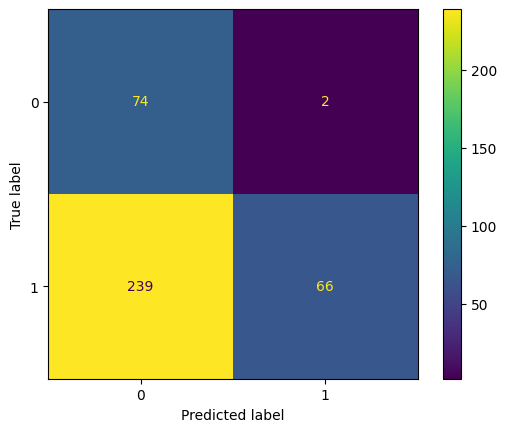

In [85]:
# Generate confusion matrix
cm = confusion_matrix(actual_labels, predicted_labels)

# Create and display confusion matrix visualization
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

# Grad-CAM

## Saliency map for frames labelled as FAKE and correctly predicted (True Positive)

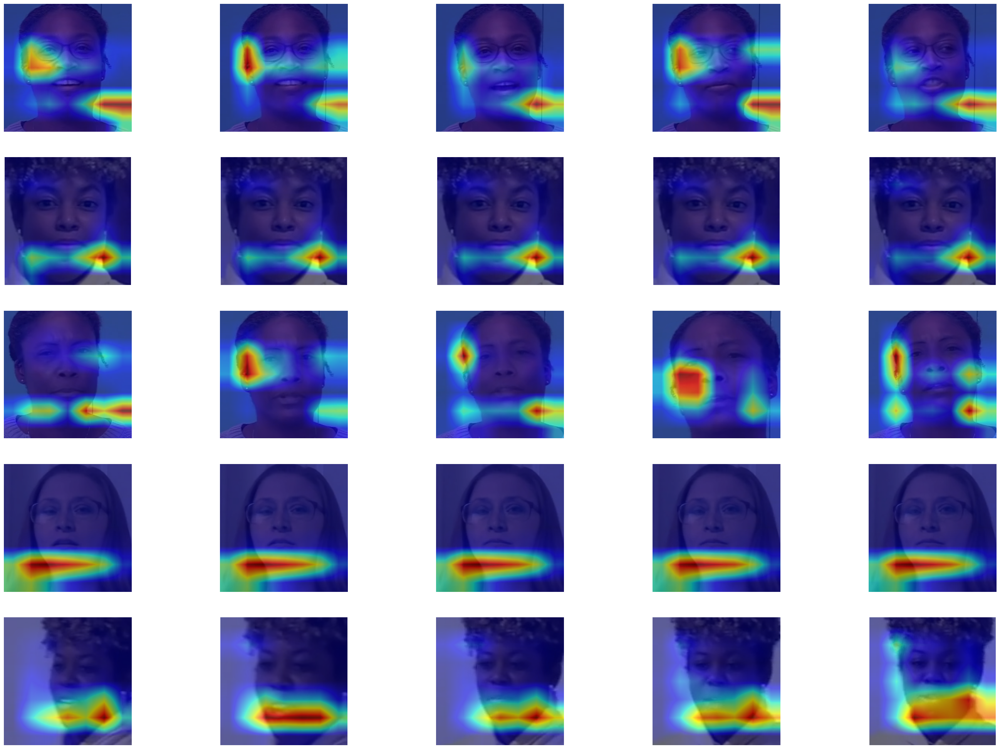

In [63]:
ids = ['aettqgevhz', 'agqphdxmwt', 'aczrgyricp', 'adylbeequz', 'aipfdnwpoo']

figsize = (35, 25)
num_cols = 5
num_images = 25
num_rows = (num_images + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

c = 0
for vid_id in ids:
    for i in range(1, 25, 5):
        img, gradcam_img = methods.get_grad_cam(celeb_df_model, celeb_df_model.act4, f'output/FAKE/{vid_id}/{i}.jpg', 0)
    
        row_index = c // num_cols
        col_index = c % num_cols
        
        axes[row_index, col_index].imshow(np.asarray(img))
        gradcam_img = 1 - gradcam_img
        im = axes[row_index, col_index].imshow(gradcam_img, alpha = 0.6, cmap='jet')
        axes[row_index, col_index].axis('off')
        
        c += 1

## Saliency map for frames labelled as REAL and correctly predicted (True Negative)

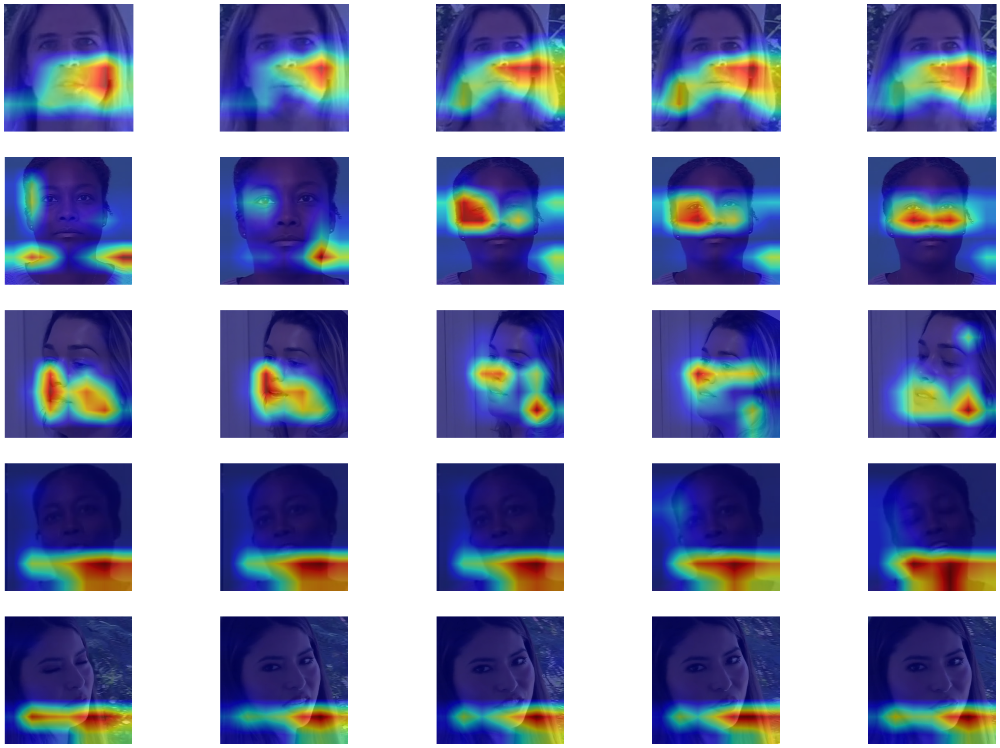

In [72]:
ids = ['aelfnikyqj', 'bddjdhzfze', 'ajqslcypsw', 'asaxgevnnp', 'beyebyhrph']

figsize = (35, 25)
num_cols = 5
num_images = 25
num_rows = (num_images + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

c = 0
for vid_id in ids:
    for i in range(1, 25, 5):
        img, gradcam_img = methods.get_grad_cam(celeb_df_model, celeb_df_model.act4, f'output/REAL/{vid_id}/{i}.jpg', 0)
    
        row_index = c // num_cols
        col_index = c % num_cols
        
        axes[row_index, col_index].imshow(np.asarray(img))
        gradcam_img = 1 - gradcam_img
        im = axes[row_index, col_index].imshow(gradcam_img, alpha = 0.6, cmap='jet')
        axes[row_index, col_index].axis('off')
        
        c += 1

## Saliency map for frames labelled as REAL and incorrectly predicted as Fake (False Positive)

### There are only two videos that are predicted using DeepFake

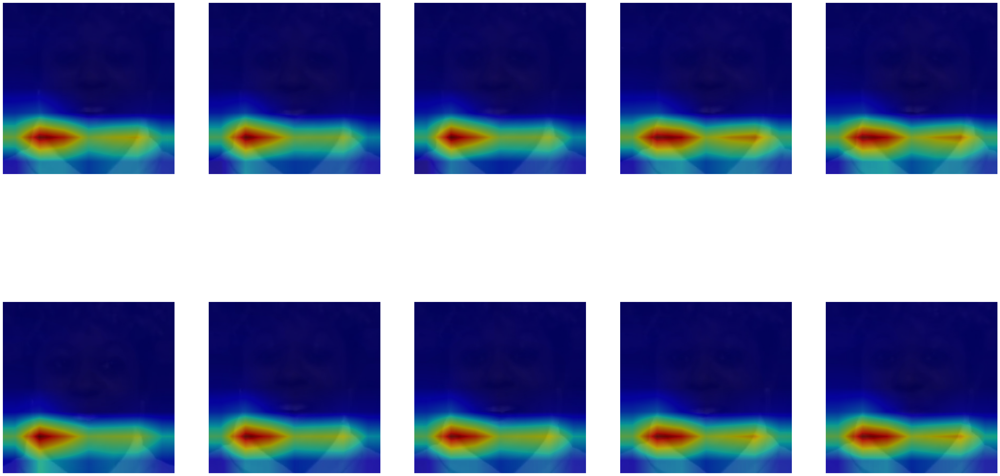

In [76]:
ids = ['ckjaibzfxa', 'dzyuwjkjui']

figsize = (45, 25)
num_cols = 5
num_images = 10
num_rows = (num_images + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

c = 0
for vid_id in ids:
    for i in range(1, 25, 5):
        img, gradcam_img = methods.get_grad_cam(celeb_df_model, celeb_df_model.act4, f'output/REAL/{vid_id}/{i}.jpg', 0)
    
        row_index = c // num_cols
        col_index = c % num_cols
        
        axes[row_index, col_index].imshow(np.asarray(img))
        gradcam_img = 1 - gradcam_img
        im = axes[row_index, col_index].imshow(gradcam_img, alpha = 0.6, cmap='jet')
        axes[row_index, col_index].axis('off')
        
        c += 1

## Saliency map for frames labelled as FAKE and incorrectly predicted as REAL (False Negative)

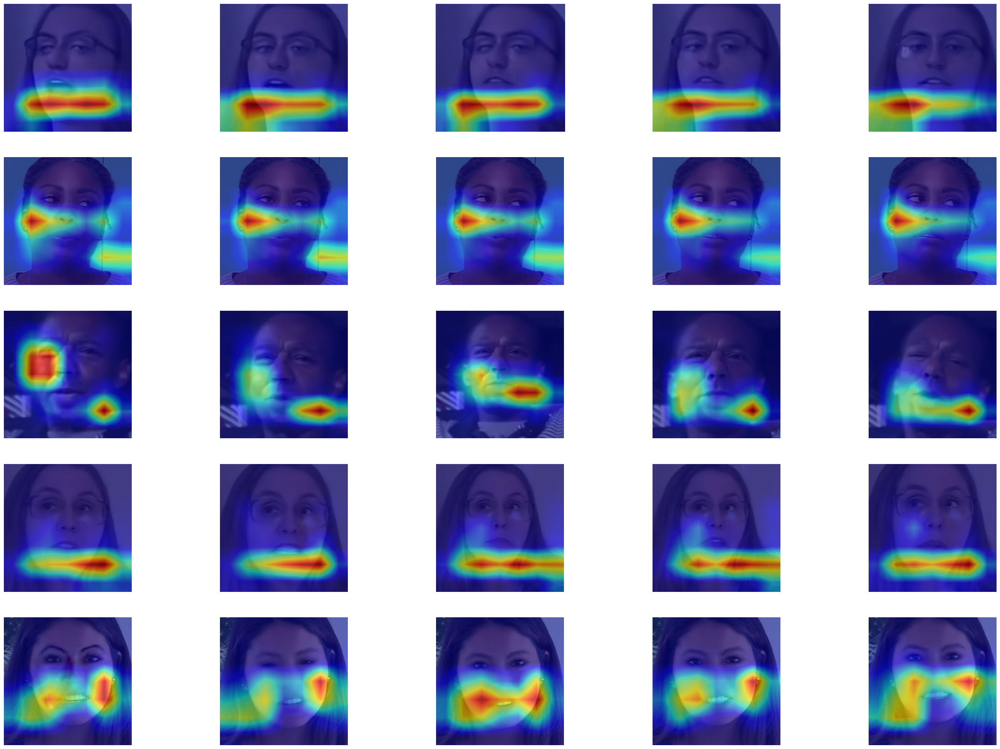

In [82]:
ids = ['ahdbuwqxit', 'ahfazfbntc', 'aladcziidp', 'abqwwspghj', 'adohikbdaz']

figsize = (35, 25)
num_cols = 5
num_images = 25
num_rows = (num_images + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

c = 0
for vid_id in ids:
    for i in range(1, 25, 5):
        img, gradcam_img = methods.get_grad_cam(celeb_df_model, celeb_df_model.act4, f'output/FAKE/{vid_id}/{i}.jpg', 0)
    
        row_index = c // num_cols
        col_index = c % num_cols
        
        axes[row_index, col_index].imshow(np.asarray(img))
        gradcam_img = 1 - gradcam_img
        im = axes[row_index, col_index].imshow(gradcam_img, alpha = 0.6, cmap='jet')
        axes[row_index, col_index].axis('off')
        
        c += 1